# Análisis de Métricas de Red: El Grafo Social de Epstein

Este cuaderno tiene como propósito explorar y cuantificar la estructura de relaciones dentro de la red social de Jeffrey Epstein. Analizar estas métricas nos permite entender cómo interactuaban los individuos, identificar a las personas con mayor influencia o control sobre el flujo de información, y evaluar la cohesión general del grupo.

A través del uso de la teoría de grafos, calcularemos y visualizaremos indicadores clave que revelan los patrones subyacentes en esta compleja red de contactos.

___

In [2]:
# Importamos las librerías necesarias
import pandas as pd
import networkx as nx
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
# Cargamos el grafo
G = nx.read_gml('../data/processed/epstein_social_graph_cleaned.gml')

# Cargamos el mapping de nodos a nombres
mapping = pd.read_csv('../data/processed/epstein_name_id_mapping.csv')

___

#### 1. Degree Metrics (Métricas de Grado)

**Concepto:** El grado (*degree*) de un nodo representa el número de conexiones directas que tiene. Es una métrica fundamental para identificar qué tan conectada está una persona en la red.

**Contexto en el grafo:** En la red de Epstein, los nodos con un alto grado corresponden a las personas que tuvieron interacción o relación directa con un gran número de otros individuos. Como es lógico, el nodo central principal debería ser el propio Epstein, pero esta métrica nos revelará quiénes eran sus principales intermediarios o asociados más frecuentes.

**Explicación del código:** A continuación, utilizamos la función `degree()` de NetworkX para obtener los grados de todos los nodos. Luego, cruzamos los IDs de los nodos con sus nombres reales usando el `mapping` cargado previamente y ordenamos los resultados para mostrar el "Top 10" de individuos más conectados. Finalmente, calculamos el grado medio de la red para entender el promedio de conexiones por persona.

In [4]:
# Calculamos los grados de los nodos en la red
degrees = dict(G.degree())

# Diccionario ID -> nombre (convertimos id a string para que coincida con G)
id_to_name = dict(zip(mapping['id'].astype(str), mapping['label_original']))

# Mostramos los 10 nodos con mayor grado
top_10_degrees = sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 nodos por grado:")

for node, deg in top_10_degrees:
    name = id_to_name.get(str(node), "Nombre no encontrado")
    print(f"{name} (ID: {node}) - Grado: {deg}")

Top 10 nodos por grado:
jeffrey epstein (ID: 3) - Grado: 276
robert trivers (ID: 738) - Grado: 44
paul krassner (ID: 613) - Grado: 38
terry kafka (ID: 825) - Grado: 38
darren indyke (ID: 145) - Grado: 30
lesley groff (ID: 456) - Grado: 20
martin weinberg (ID: 499) - Grado: 19
michael keough (ID: 529) - Grado: 18
frank pizzurro (ID: 224) - Grado: 16
richard kahn (ID: 700) - Grado: 16


In [5]:
# Calculamos el grado medio de la red utilizando la fórmula vista en clase
print(f"Grado medio de la red: {2*G.number_of_edges() / float(G.number_of_nodes()):.4f}")

Grado medio de la red: 2.3709


___

#### 2. Degree Distribution (Distribución de Grados)

**Concepto:** La distribución de grados evalúa cómo se reparten las conexiones a lo largo de toda la red, indicando la frecuencia de cada valor de grado.

**Contexto en el grafo:** En la mayoría de las redes sociales reales, suele haber una gran cantidad de nodos con pocas conexiones y un pequeño número de nodos con muchísimas conexiones (hubs). Analizar esta distribución nos permite visualizar gráficamente la desigualdad en las conexiones dentro del entorno de Epstein.

**Explicación del código:** El código extrae la lista de grados, cuenta sus frecuencias y genera dos representaciones visuales mediante `matplotlib` y `seaborn`. El gráfico de barras muestra la cantidad exacta de nodos por cada grado específico. El diagrama de caja (*box-plot*) horizontal facilita la identificación de la media, la mediana y los valores atípicos (*outliers*), que representan a los individuos clave extremadamente conectados.

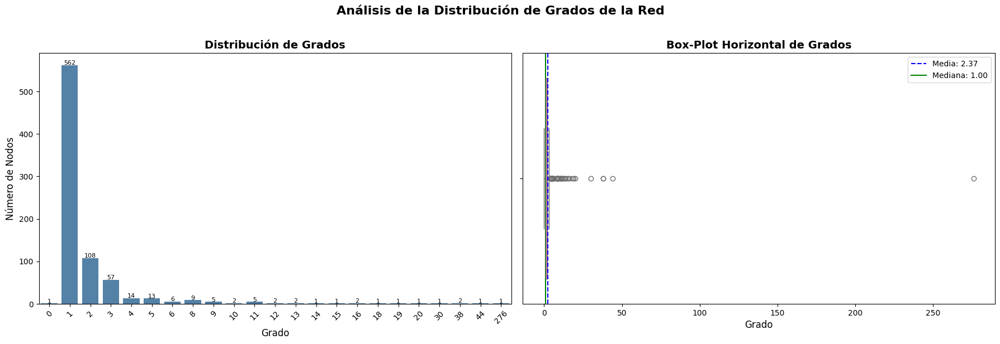

In [6]:
# Calculamos la distribución de grados
degree_sequence = sorted(degrees.values(), reverse=True)
degree_count = pd.Series(degree_sequence).value_counts().sort_index()

# Graficamos la distribución de grados
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Bar plot
sns.barplot(x=degree_count.index, y=degree_count.values, color='steelblue', ax=axes[0])
axes[0].set_title("Distribución de Grados", fontsize=14, fontweight='bold')
axes[0].set_xlabel("Grado", fontsize=12)
axes[0].set_ylabel("Número de Nodos", fontsize=12)
axes[0].tick_params(axis='x', rotation=45)
for i, v in enumerate(degree_count.values):
    axes[0].text(i, v + 0.5, str(v), ha='center', fontsize=8)

# Box plot horizontal
deg_series = pd.Series(degree_sequence)

sns.boxplot(x=deg_series, orient='h', color='lightcoral', ax=axes[1])
axes[1].set_title("Box-Plot Horizontal de Grados", fontsize=14, fontweight='bold')
axes[1].set_xlabel("Grado", fontsize=12)
axes[1].set_ylabel("")

# Añadimos estadísticas al boxplot
median = deg_series.median()
mean = deg_series.mean()
axes[1].axvline(mean, color='blue', linestyle='--', linewidth=1.5, label=f'Media: {mean:.2f}')
axes[1].axvline(median, color='green', linestyle='-', linewidth=1.5, label=f'Mediana: {median:.2f}')
axes[1].legend(fontsize=10)

plt.suptitle("Análisis de la Distribución de Grados de la Red", fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

----

#### 3. Betweenness Centrality (Centralidad de Intermediación)

**Concepto:** Esta métrica mide la frecuencia con la que un nodo se encuentra en el camino más corto entre otros dos nodos de la red.

**Contexto en el grafo:** Un alto *betweenness* en el círculo de Epstein indica a los individuos que funcionaban como "puentes" entre diferentes grupos o camarillas sociales que de otra forma no estarían conectados. Estas personas actuaban como controladores (*gatekeepers*) del flujo de contactos e información en la red.

**Explicación del código:** Aquí definimos la función `top_betweenness_nodes` que computa esta métrica usando la librería NetworkX. Permite la opción de calcular la intermediación puramente topológica (sin pesos) o tomando en cuenta la fuerza de las interacciones mediante una distancia inversa (`1/weight`), considerando que vínculos más fuertes hacen que los caminos sean más "cortos".

In [7]:
# Vamos ahora a ver cuales son los nodos con mayor betweenness.
def top_betweenness_nodes(
    G: nx.Graph,
    mapping: pd.DataFrame,
    top_n: int = 10,
    use_inverse_weight: bool = False,
    normalized: bool = True
) -> pd.DataFrame:
    """
    Calcula la betweenness centrality y devuelve los top_n nodos.

    Parámetros
    ----------
    G : nx.Graph
        Grafo de NetworkX.
    mapping : pd.DataFrame
        DataFrame con columnas ['id', 'label_original'].
    top_n : int
        Número de nodos a devolver.
    use_inverse_weight : bool
        Si True, usa distance = 1/weight para que más interacción implique
        caminos más "cortos". Si False, calcula betweenness sin pesos.
    normalized : bool
        Si True, normaliza la centralidad.

    Returns
    -------
    pd.DataFrame
        DataFrame con rank, node_id, name y betweenness.
    """

    # Mapeo ID -> nombre
    id_to_name = dict(zip(mapping["id"].astype(str), mapping["label_original"]))

    if use_inverse_weight:
        # Copia del grafo para no modificar el original
        H = G.copy()

        # Crear atributo de distancia inversa
        for u, v, data in H.edges(data=True):
            w = data.get("weight", 1)
            data["distance"] = 1 / w if w != 0 else float("inf")

        bet = nx.betweenness_centrality(
            H,
            normalized=normalized,
            weight="distance"
        )
    else:
        # Betweenness no ponderada
        bet = nx.betweenness_centrality(
            G,
            normalized=normalized,
            weight=None
        )

    top_nodes = sorted(bet.items(), key=lambda x: x[1], reverse=True)[:top_n]

    rows = []
    for rank, (node, value) in enumerate(top_nodes, start=1):
        rows.append({
            "rank": rank,
            "node_id": node,
            "name": id_to_name.get(str(node), "Nombre no encontrado"),
            "betweenness": value
        })

    return pd.DataFrame(rows)

A continuación, aplicamos la función definida para mostrar a las personas que actúan como puentes principales de la red, evaluando primero el escenario topológico (sin pesos) y posteriormente el escenario ajustado a la fortaleza de los lazos.

In [8]:
# Opción 1: sin pesos
top7_bw = top_betweenness_nodes(G, mapping, top_n=10, use_inverse_weight=False)
print("Top 10 nodos por betweenness (sin pesos):")
print(top7_bw.to_string(index=False))

# Opción 2: con distancia inversa 1/weight
top7_bw_inv = top_betweenness_nodes(G, mapping, top_n=10, use_inverse_weight=True)
print("\nTop 10 nodos por betweenness (usando distancia inversa 1/weight):")
print(top7_bw_inv.to_string(index=False))

Top 10 nodos por betweenness (sin pesos):
 rank node_id            name  betweenness
    1       3 jeffrey epstein     0.695616
    2     825     terry kafka     0.113596
    3     738  robert trivers     0.088513
    4     613   paul krassner     0.088353
    5     499 martin weinberg     0.051668
    6     413  kathy ruemmler     0.051288
    7     684 reid weingarten     0.042020
    8     446 lawrence krauss     0.040453
    9     145   darren indyke     0.030490
   10     530  michael miller     0.027969

Top 10 nodos por betweenness (usando distancia inversa 1/weight):
 rank node_id            name  betweenness
    1       3 jeffrey epstein     0.729759
    2     825     terry kafka     0.120398
    3     738  robert trivers     0.090553
    4     613   paul krassner     0.086400
    5     684 reid weingarten     0.065043
    6     499 martin weinberg     0.050979
    7     413  kathy ruemmler     0.050768
    8     145   darren indyke     0.048889
    9     347 jessica cadwell  

In [9]:
def plot_ego_graph_with_names(
    G: nx.Graph,
    mapping: pd.DataFrame,
    center_node,
    radius=1,
    figsize=(200, 200),
    seed=40
):
    """
    Plotea el ego-network de un nodo mostrando nombres en vez de IDs.
    Acepta center_node como int o str.
    """

    center_node = str(center_node)

    if center_node not in G:
        raise ValueError(
            f"El nodo {center_node} no existe en el grafo. "
            f"Ejemplo de nodos válidos: {list(G.nodes())[:10]}"
        )

    # Importante: convertir IDs del mapping a string
    id_to_name = dict(zip(mapping["id"].astype(str), mapping["label_original"]))

    ego = nx.ego_graph(G, center_node, radius=radius)

    # Renombrar nodos con nombres legibles
    rename_dict = {n: id_to_name.get(str(n), str(n)) for n in ego.nodes()}
    ego_named = nx.relabel_nodes(ego, rename_dict)

    plt.figure(figsize=figsize)
    pos = nx.spring_layout(ego_named, seed=seed)

    degrees = dict(ego_named.degree())
    node_sizes = [degrees[n] * 80 + 100 for n in ego_named.nodes()]

    edge_widths = []
    for u, v, data in ego_named.edges(data=True):
        w = data.get("weight", 1)
        edge_widths.append(w * 0.3)

    nx.draw_networkx_nodes(ego_named, pos, node_size=node_sizes, alpha=0.85)
    nx.draw_networkx_edges(ego_named, pos, width=edge_widths, alpha=0.35)
    nx.draw_networkx_labels(ego_named, pos, font_size=9)

    center_name = id_to_name.get(center_node, center_node)
    plt.title(f"Ego-network de {center_name}")
    plt.axis("off")
    plt.show()
    
plot_ego_graph_with_names(G, mapping, center_node=1, radius=10)

#### 4. Motifs (Clustering & Transitivity)

**Concepto:** El coeficiente de clustering local mide la tendencia de los contactos de una persona a estar también conectados entre sí (la formación de triángulos o tríadas). La transitividad (*transitivity*) es la adaptación macro de esta métrica y nos dice de forma global qué tan común es que los amigos de mis amigos sean mis amigos en toda la red.

**Contexto en el grafo:** Un clustering local y una transitividad altos sugerirían que la red de Epstein estaba compuesta por grupos o logias muy cerradas y cohesionadas. Por el contrario, valores bajos indicarían un entorno más fragmentado donde las personas solo estaban conectadas de manera radial hacia la figura de Epstein sin conocerse entre sí.

**Explicación del código:** Utilizando las funciones de NetworkX `clustering(G)` y `transitivity(G)`, calculamos respectivamente el coeficiente local de cada persona y el nivel de transitividad global del grafo entero, imprimiendo posteriormente los hallazgos.

In [10]:
# Clustering local de cada nodo
clustering_dict = nx.clustering(G)

# Transitivity global de toda la red
transitivity_value = nx.transitivity(G)

print("Clustering de algunos nodos:")
for node in list(clustering_dict.keys())[:5]:
    print(node, clustering_dict[node])

print("\nTransitivity global:")
print(transitivity_value)

Clustering de algunos nodos:
0 0
1 0
2 0
3 0.0026086956521739132
4 0.16666666666666666

Transitivity global:
0.013493253373313344
